Loading of Notebook might take some time because of Plotly visualizations. Kindly be patient!

#### The objective of the Notebook:

The objective of this notebook is to study the COVID-19 outbreak with the help of some basic visualizations techniques. Perform predictions and Time Series forecasting in order to study the impact and spread of the COVID-19 in the coming days.

In this notebook I will try to use Seasonal ARIMA Models, Seasonal ARIMA Models with eXogenous factors, and FBProphet.

In [1]:
# Install GitPython module to update the project dataset automatically.
!pip install gitpython
# Time series Stationary check, estimate statistical models, and perform statistical tests.
! pip install statsmodels
# A statistical library designed to fill the void in Python's time series analysis capabilities.
! pip install pmdarima
# Library for time series distances.
! pip install dtaidistance

     |████████████████████████████████| 1.4 MB 287 kB/s            
     |████████████████████████████████| 797 kB 243 kB/s            
  Installing build dependencies ... - \ | / - \ | / - \ done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - \ done
  Created wheel for dtaidistance: filename=dtaidistance-2.3.6-cp37-cp37m-linux_x86_64.whl size=2063863 sha256=8232a83f93b95947d59e449497a0d39a4673f64e33fcd6366ed9a7ec17cdaa89
  Stored in directory: /root/.cache/pip/wheels/a4/04/e5/ff7fd821276e7ec68893652d36b6a13f230ecdcafdc3283b3f
Successfully built dtaidistance


Fitch the last updated data from 'ourworldindata.org', rename the csv file by date

In [2]:
import urllib.request
from datetime import datetime, timedelta
try:
    print("Downloading the file ... ")
    timenow = datetime.now()
    #timenow_iso = timenow.strftime('%Y_%m_%dT%H_%M_%S') #Time ISO to second resolution
    timenow_iso = timenow.strftime('%Y_%m_%d') #Time ISO to day resolution
    url = 'https://covid.ourworldindata.org/data/owid-covid-data.csv' #url
    covid= f'covid_{timenow_iso}.csv' # output's file name/ location
    urllib.request.urlretrieve(url, covid)
    print(f"File {covid} is saved!")
except Exception as e:
    print("Downloading file error: " + str(e))

File covid_2022_02_28.csv is saved!


Import libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
%matplotlib inline
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Display all the columns and rows of dataframe
pd.pandas.set_option('display.max_columns',None)
pd.pandas.set_option('display.max_rows',None)

## The lifecycle of the project
1. Data Analysis
2. Feature Selection
3. Feature Engineering
4. Data Visualization
5. Model Building

## Data Analysis Phase
#### To understand more about:
1. Explore missing values.
2. All the numerical and categorical variables.
3. Correlation among features.

In [5]:
# Load data to DataFrame
df1=pd.read_csv(covid)
df1.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,0.126,0.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164938 entries, 0 to 164937
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    164938 non-null  object 
 1   continent                                   155060 non-null  object 
 2   location                                    164938 non-null  object 
 3   date                                        164938 non-null  object 
 4   total_cases                                 161922 non-null  float64
 5   new_cases                                   161847 non-null  float64
 6   new_cases_smoothed                          160696 non-null  float64
 7   total_deaths                                144139 non-null  float64
 8   new_deaths                                  144271 non-null  float64
 9   new_deaths_smoothed                         144141 non-null  float64
 

Dataset has 67 columns with 157476 entries, except (iso_code,location, and date), all features have missing values.

In [7]:
# Function return the missing values percentage per feature
def miss_per_col(df):
    cols_na=df.columns[df.isnull().any()]
    # The percentage of missing values for eah feature
    for col in cols_na:
        print(col,df[col].count(),df[col].isnull().sum(),(np.round(df[col].isnull().mean()*100)),'%')
miss_per_col(df1)

continent 155060 9878 6.0 %
total_cases 161922 3016 2.0 %
new_cases 161847 3091 2.0 %
new_cases_smoothed 160696 4242 3.0 %
total_deaths 144139 20799 13.0 %
new_deaths 144271 20667 13.0 %
new_deaths_smoothed 144141 20797 13.0 %
total_cases_per_million 161170 3768 2.0 %
new_cases_per_million 161095 3843 2.0 %
new_cases_smoothed_per_million 159949 4989 3.0 %
total_deaths_per_million 143400 21538 13.0 %
new_deaths_per_million 143532 21406 13.0 %
new_deaths_smoothed_per_million 143402 21536 13.0 %
reproduction_rate 124691 40247 24.0 %
icu_patients 23235 141703 86.0 %
icu_patients_per_million 23235 141703 86.0 %
hosp_patients 24384 140554 85.0 %
hosp_patients_per_million 24384 140554 85.0 %
weekly_icu_admissions 5322 159616 97.0 %
weekly_icu_admissions_per_million 5322 159616 97.0 %
weekly_hosp_admissions 10762 154176 93.0 %
weekly_hosp_admissions_per_million 10762 154176 93.0 %
new_tests 66819 98119 59.0 %
total_tests 68741 96197 58.0 %
total_tests_per_thousand 68741 96197 58.0 %
new_tests_

In [8]:
# Function return the missing values percentage per feature per any country has a missing value 
def miss_per_country_per_col(df):
    cols_na=df.columns[df.isnull().any()]
    print(cols_na)
    # The percentage of missing values for each feature by country
    for row in df['location'].unique():
        for col in cols_na:
            x=df[df['location']==row][col].count()
            if x==0:
                print(row,col,(x))

In [9]:
# miss_per_country_per_col(df1)

Explore the missing values in the continent feature

In [10]:
# Check continent feature
df1[df1['continent'].isnull()].groupby('location')['iso_code'].count()

location
Africa                 746
Asia                   768
Europe                 767
European Union         767
High income            768
International          752
Low income             736
Lower middle income    768
North America          768
Oceania                765
South America          737
Upper middle income    768
World                  768
Name: iso_code, dtype: int64

The continent values in the location feature is same values in continent feature, so will drop them.
There is four values of location deviding the countries depending on the income, but it relys on data from 2009, so will delete them also.

Show the first day has cases records 

In [11]:
df1.groupby('date')[['new_cases','total_cases']].sum().head(25)

,new_cases,total_cases
date,,
2020-01-01,0.0,0.0
2020-01-02,0.0,0.0
2020-01-03,0.0,0.0
2020-01-04,0.0,0.0
2020-01-05,0.0,0.0
2020-01-06,0.0,0.0
2020-01-07,0.0,0.0
2020-01-08,0.0,0.0
2020-01-09,0.0,0.0


## Features Selection
#### To reduce the features and  skip the not useful ones.

In [12]:
# Drop the unuseful features, either can get their values from other features or most of their values are null.
df2=df1.copy()
df2=df2.drop(columns=['new_cases_smoothed', 'new_deaths_smoothed','total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests_per_thousand',
       'new_tests_per_thousand', 'new_tests_smoothed',
       'new_tests_smoothed_per_thousand', 'tests_per_case', 'tests_units',
       'total_boosters', 'new_vaccinations_smoothed',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',
       'new_vaccinations_smoothed_per_million',
       'new_people_vaccinated_smoothed',
       'new_people_vaccinated_smoothed_per_hundred', 'aged_70_older',
        'extreme_poverty', 'female_smokers', 'male_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative',
       'excess_mortality', 'excess_mortality_cumulative_per_million'])

## Feature Engineering Phase
#### Performing:
1. Drop the missing values in categorical feature (continent).
2. Fill the missing values in numerical features.
3. Temporal feature.

Drop the continent and any observation other than a country from location feature


In [13]:
df3=df2.copy()
df3=df3[df3['continent'].notna()].reset_index(drop=True)

Drop the days that have no records, which are from (2020-01-01 to 2020-01-21)	

In [14]:
df3=df3[(df3['date'])>('2020-01-21')].reset_index(drop=True)

In [15]:
# Check the first record day 
df3.groupby('date').sum()[['new_cases','total_cases']].head(1)

,new_cases,total_cases
date,,
2020-01-22,0.0,557.0


To fill null values in total features, we should consider that, for any record day,  should be greater or equal the previuos record day in its feature.
If the first days of a total feature is null, will fill them with zero.

In [16]:
# Fill the Null values in all total features
df4=df3.copy()
df4[['total_cases','total_deaths','total_tests','total_vaccinations','people_fully_vaccinated','stringency_index']] = df3.groupby(['location'], sort=False)[['total_cases','total_deaths','total_tests','total_vaccinations','people_fully_vaccinated','stringency_index']].apply(lambda x: x.ffill().fillna(0))

Fill missing values of ('reproduction_rate','positive_rate') by zero

In [17]:
# Fill the Null values by zero
df4[['reproduction_rate','positive_rate']]=df3[['reproduction_rate','positive_rate']].fillna(0)

To fill null values in new features, we should consider that all records should be compatable wihh its total features.

In [18]:
# Finction fills the Null values in all new features with respect to its total features
def fillna_feature(df,new,total):
    x=df[df.groupby('location')[total].diff()<0].index
    while len(x)>0:
        for i in x:
            df.loc[i,total]=df.loc[i-1,total]
        x=df[df.groupby('location')[total].diff()<0].index
    df[new]=df.groupby('location')[total].diff()
    df.loc[df.groupby('location')[new].head(1).index, new] = df.loc[df.groupby('location')[new].head(1).index, total]
    return df

In [19]:
df5=df4.copy()

In [20]:
# Update the new_cases feature
df5=fillna_feature(df5,'new_cases','total_cases')

In [21]:
# Update the new_deaths feature
df5=fillna_feature(df5,'new_deaths','total_deaths')

In [22]:
# Update the new_tests feature
df5=fillna_feature(df5,'new_tests','total_tests')

In [23]:
# Update the new_vaccinations feature
df5=fillna_feature(df5,'new_vaccinations','total_vaccinations')

In [24]:
# Change the people_vaccinated and people_fully_vaccinated feature names to be more clear
df6=df5.copy()
df6.rename(columns={'people_vaccinated':'total_first_shot_vac','people_fully_vaccinated':'total_fully_vaccinated'}, inplace=True)
df6.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,new_tests,total_tests,positive_rate,total_vaccinations,total_first_shot_vac,total_fully_vaccinated,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,gdp_per_capita,cardiovasc_death_rate,diabetes_prevalence,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,8.33,39835428.0,54.422,18.6,2.581,1803.987,597.029,9.59,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,8.33,39835428.0,54.422,18.6,2.581,1803.987,597.029,9.59,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,8.33,39835428.0,54.422,18.6,2.581,1803.987,597.029,9.59,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,8.33,39835428.0,54.422,18.6,2.581,1803.987,597.029,9.59,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,8.33,39835428.0,54.422,18.6,2.581,1803.987,597.029,9.59,64.83,0.511


In [25]:
# Update the total_first_shot_vac feature by the subtract total_fully_vaccinated from total_vaccinations
df7=df6.copy()
for i in range(0,len(df7)):
    df7.loc[i,'total_first_shot_vac']=df7.loc[i,'total_vaccinations']-df7.loc[i,'total_fully_vaccinated']


In [26]:
# Check the missing values percentage per feature
miss_per_col(df7)

population 154671 317 0.0 %
population_density 145860 9128 6.0 %
median_age 135848 19140 12.0 %
aged_65_older 134372 20616 13.0 %
gdp_per_capita 136514 18474 12.0 %
cardiovasc_death_rate 134801 20187 13.0 %
diabetes_prevalence 141918 13070 8.0 %
life_expectancy 153128 1860 1.0 %
human_development_index 134282 20706 13.0 %


In [27]:
# Chart for all features have any missing value 
def missing_values_chart(df):
    missing_values = df.isnull().sum() / len(df)
    missing_values = missing_values[missing_values > 0]
    missing_values.sort_values(inplace=True)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['Missed_values']
    missing_values.index.names = ['Feature']
    missing_values['Feature'] = missing_values.index
    sns.set(style="whitegrid", color_codes=True)
    sns.barplot(x = 'Feature', y = 'Missed_values', data=missing_values)
    plt.xticks(rotation = 90)
    plt.show()

Drop countries that has a lot of missing values in most of features.

In [28]:
# List of countries with missed data 
def countries_with_missed_data(df):
    countries_with_missed_data_list=[]
    # The percentage of missing values for eah feature by country
    for row in df['location'].unique():
        for col in df.columns[df.isnull().any()]:
            x=df[df['location']==row][col].count()
            if x==0:
                countries_with_missed_data_list.append(row)
                break
    return countries_with_missed_data_list

In [29]:
countries_with_missed_data_list=countries_with_missed_data(df7)
# countries_with_missed_data_list

In [30]:
# Except these countries from the countries_with_missed_data_list
countries=["Syria","Taiwan","Somalia","Hong Kong","Cuba",'South Sudan']
for i in countries:
    countries_with_missed_data_list.remove(i)
    print(i)

Syria
Taiwan
Somalia
Hong Kong
Cuba
South Sudan


In [31]:
# Drop countries_with_missed_data_list from location feature
df8=df7.copy()
df8=df8[~df8['location'].isin(countries_with_missed_data_list)].reset_index(drop=True)

In [32]:
# Check the countries that have any missing values
# miss_per_country_per_col(df8)

In [33]:
df8.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132219 entries, 0 to 132218
Data columns (total 26 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   iso_code                 132219 non-null  object 
 1   continent                132219 non-null  object 
 2   location                 132219 non-null  object 
 3   date                     132219 non-null  object 
 4   total_cases              132219 non-null  float64
 5   new_cases                132219 non-null  float64
 6   total_deaths             132219 non-null  float64
 7   new_deaths               132219 non-null  float64
 8   reproduction_rate        132219 non-null  float64
 9   new_tests                132219 non-null  float64
 10  total_tests              132219 non-null  float64
 11  positive_rate            132219 non-null  float64
 12  total_vaccinations       132219 non-null  float64
 13  total_first_shot_vac     132219 non-null  float64
 14  tota

In [34]:
df8.dtypes

iso_code                    object
continent                   object
location                    object
date                        object
total_cases                float64
new_cases                  float64
total_deaths               float64
new_deaths                 float64
reproduction_rate          float64
new_tests                  float64
total_tests                float64
positive_rate              float64
total_vaccinations         float64
total_first_shot_vac       float64
total_fully_vaccinated     float64
new_vaccinations           float64
stringency_index           float64
population                 float64
population_density         float64
median_age                 float64
aged_65_older              float64
gdp_per_capita             float64
cardiovasc_death_rate      float64
diabetes_prevalence        float64
life_expectancy            float64
human_development_index    float64
dtype: object

Convert date feature type to Date.

In [35]:
df9=df8.copy()
df9['date']=pd.to_datetime(df9['date'])
df9.dtypes

iso_code                           object
continent                          object
location                           object
date                       datetime64[ns]
total_cases                       float64
new_cases                         float64
total_deaths                      float64
new_deaths                        float64
reproduction_rate                 float64
new_tests                         float64
total_tests                       float64
positive_rate                     float64
total_vaccinations                float64
total_first_shot_vac              float64
total_fully_vaccinated            float64
new_vaccinations                  float64
stringency_index                  float64
population                        float64
population_density                float64
median_age                        float64
aged_65_older                     float64
gdp_per_capita                    float64
cardiovasc_death_rate             float64
diabetes_prevalence               

In [36]:
# Show the countries that have any missing values in population_density feature
df9[df9['population_density'].isnull()].groupby('location').sum()

,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,new_tests,total_tests,positive_rate,total_vaccinations,total_first_shot_vac,total_fully_vaccinated,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,gdp_per_capita,cardiovasc_death_rate,diabetes_prevalence,life_expectancy,human_development_index
location,,,,,,,,,,,,,,,,,,,,,,
South Sudan,5269486.0,16955.0,59414.0,137.0,590.71,330958.0,7.560707e+07,22.4158,4.280400e+07,1.891539e+07,2.388862e+07,431539.0,37131.37,7.898676e+09,0.0,13324.8,2388.054,1089502.272,194857.850,7238.42,40147.90,300.502
Syria,13959287.0,54480.0,879890.0,3071.0,662.12,0.0,0.000000e+00,0.0000,3.180388e+08,1.988157e+08,1.192230e+08,3073678.0,36004.73,1.293920e+10,0.0,15363.6,0.000,0.000,266394.912,0.00,51471.60,401.436
Taiwan,4797854.0,20433.0,218259.0,853.0,652.82,6277837.0,1.022854e+09,3.3509,5.762895e+09,3.752259e+09,2.010635e+09,46814037.0,25027.05,1.832065e+10,0.0,32409.6,0.000,0.000,79838.976,0.00,61793.28,0.000


In [37]:
# Function fill the missing values in population_density feature with respect to its population and square_km
def population_density(df,location,km_2):
    ind=df[df['location']==location].index
    df.loc[ind[0]:ind[-1],"population_density"].fillna(value=np.round((df[df['location'] == location].loc[:, 'population']/km_2),decimals=3),inplace=True)

In [38]:
# Fill the missing values in population_density feature with respect to its population and square_km
df10=df9.copy()
population_density(df10,'South Sudan',644329)
population_density(df10,'Syria',185180)
population_density(df10,'Taiwan',36197)
df10.groupby('location')['population_density'].max()

location
Afghanistan                           54.422
Albania                              104.871
Algeria                               17.348
Angola                                23.890
Antigua and Barbuda                  231.845
Argentina                             16.177
Armenia                              102.931
Australia                              3.202
Austria                              106.749
Azerbaijan                           119.309
Bahamas                               39.497
Bahrain                             1935.907
Bangladesh                          1265.036
Barbados                             664.463
Belarus                               46.858
Belgium                              375.564
Belize                                16.426
Benin                                 99.110
Bhutan                                21.188
Bolivia                               10.202
Bosnia and Herzegovina                68.496
Botswana                               4.044
B

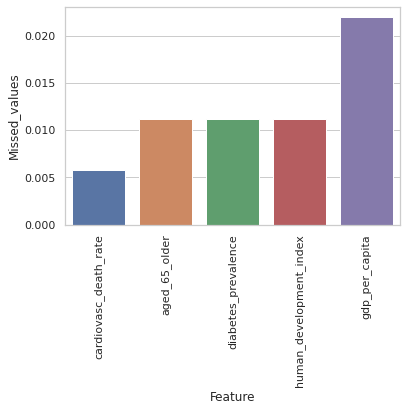

In [39]:
# Check the features that have any missing values
missing_values_chart(df10)

In [40]:
# Function fill the missing values in the given feature by a given value
def fillna_features(df,location,feature,value):
    ind=df[df['location']==location].index
    df.loc[ind[0]:ind[-1],feature].fillna(value=value,inplace=True)

In [41]:
# Fill the missing values in the given feature by a given value
df11=df10.copy()
fillna_features(df11,'Syria','diabetes_prevalence',9.9)
fillna_features(df11,'Taiwan','diabetes_prevalence',8.3)
# https://www.worldometers.info/gdp/gdp-per-capita/
fillna_features(df11,'Cuba','gdp_per_capita',8541)
fillna_features(df11,'Syria','gdp_per_capita',2030)
fillna_features(df11,'Taiwan','gdp_per_capita',32787)
fillna_features(df11,'Somalia','gdp_per_capita',309)
# https://www.socialindicators.org.hk/en/indicators/health/6.15
fillna_features(df11,'Hong Kong','cardiovasc_death_rate',52.32)
fillna_features(df11,'Somalia','human_development_index',0.285)
fillna_features(df11,'Taiwan','human_development_index',0.916)
fillna_features(df11,'Taiwan','aged_65_older',16)
fillna_features(df11,'Syria','aged_65_older',4)

Cast all total and new features to int

In [42]:
float_feature_list=['total_cases','total_deaths','total_tests',
                    'total_vaccinations','new_cases','new_deaths',
                    'new_tests','new_vaccinations','total_fully_vaccinated',
                    'total_first_shot_vac','population']
for feature in float_feature_list:
    df11[feature]=df11[feature].astype('int32')

In [43]:
# Save the cleaned dataset in CSV file
df11.to_csv('covid_19_cleaned.csv', index=False)

Get the total deaths, tests, cases, and vaccinated for each continent

In [44]:
df11.groupby(['location'])[['continent','total_deaths','total_tests','total_cases','total_fully_vaccinated','total_first_shot_vac']].last().groupby('continent').sum()

,total_deaths,total_tests,total_cases,total_fully_vaccinated,total_first_shot_vac
continent,,,,,
Africa,248432.0,8.208778e+07,11230635.0,1.761956e+08,2.206067e+08
Asia,1351751.0,1.881062e+09,116543650.0,3.017295e+09,4.274821e+09
Europe,1705292.0,2.093719e+09,156487084.0,4.815730e+08,7.543651e+08
North America,1373732.0,9.091699e+08,92764063.0,3.668978e+08,5.627877e+08
Oceania,6807.0,7.069108e+07,3410790.0,2.570277e+07,4.166222e+07
South America,1257140.0,2.114834e+08,54152481.0,3.044785e+08,4.630654e+08


Final Check for cleaned data

In [45]:
df11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132219 entries, 0 to 132218
Data columns (total 26 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   iso_code                 132219 non-null  object        
 1   continent                132219 non-null  object        
 2   location                 132219 non-null  object        
 3   date                     132219 non-null  datetime64[ns]
 4   total_cases              132219 non-null  int32         
 5   new_cases                132219 non-null  int32         
 6   total_deaths             132219 non-null  int32         
 7   new_deaths               132219 non-null  int32         
 8   reproduction_rate        132219 non-null  float64       
 9   new_tests                132219 non-null  int32         
 10  total_tests              132219 non-null  int32         
 11  positive_rate            132219 non-null  float64       
 12  total_vaccinatio

## Data Visualization

Plot min/max 20 countries in a total/new (cases, deathes, vac or tests) worldwide

In [46]:
# Plot function to show min_max selected numder of countries in a total/new (cases, deathes, vac or tests) worldwide
def worldwide(df,min_max,total_new,n=20):
# df->dataframe
# min_max->the minimum or maximum countries
# n->number of countries to show
# total_new-> total/new (cases, deathes, vac or tests) 
    country_plot = df.groupby('location')[total_new].max().reset_index().sort_values(total_new,ascending=False)
    if min_max=='max':
        fig =px.bar(country_plot.head(n),x='location',y=total_new,template='none',title=f'{total_new} worldwide')
    else:
        fig =px.bar(country_plot.tail(n),x='location',y=total_new,template='none',title=f'{total_new} worldwide')

    fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()

In [47]:
worldwide(df11,'max','total_tests')

Summary Plot of Worldwide  confirmed cases, deaths, vaccinated, and tested

In [48]:
df11.groupby(['location'])[['continent','total_deaths','total_tests','total_cases','total_fully_vaccinated']].last().groupby('continent').sum()

,total_deaths,total_tests,total_cases,total_fully_vaccinated
continent,,,,
Africa,248432.0,8.208778e+07,11230635.0,1.761956e+08
Asia,1351751.0,1.881062e+09,116543650.0,3.017295e+09
Europe,1705292.0,2.093719e+09,156487084.0,4.815730e+08
North America,1373732.0,9.091699e+08,92764063.0,3.668978e+08
Oceania,6807.0,7.069108e+07,3410790.0,2.570277e+07
South America,1257140.0,2.114834e+08,54152481.0,3.044785e+08


Plot a chart of reproduction rate per country

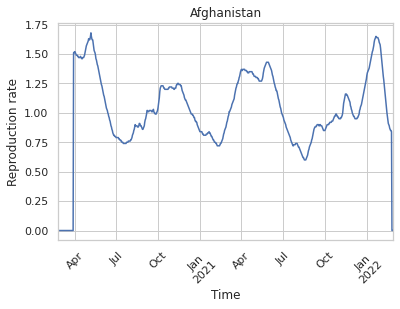

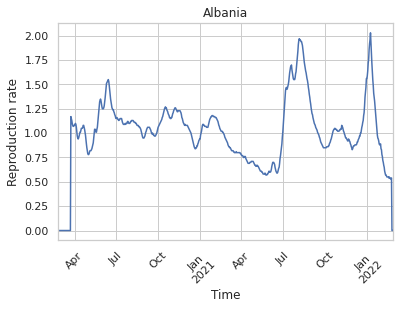

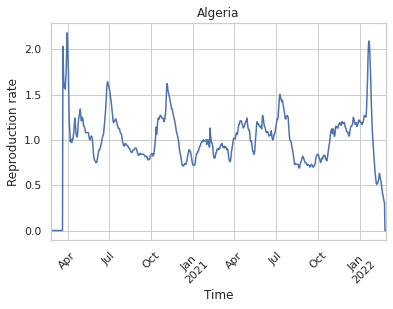

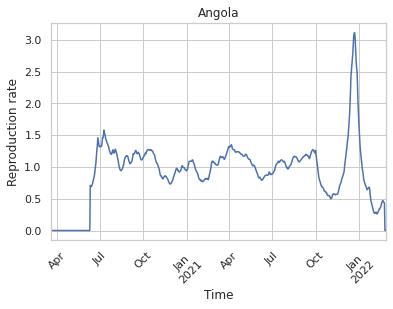

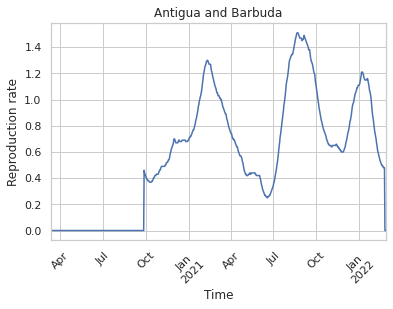

...

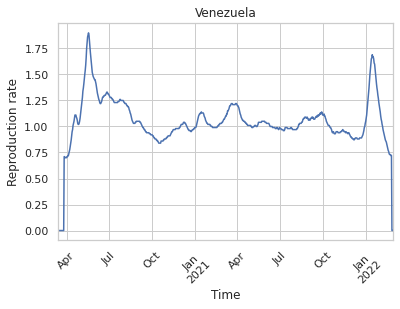

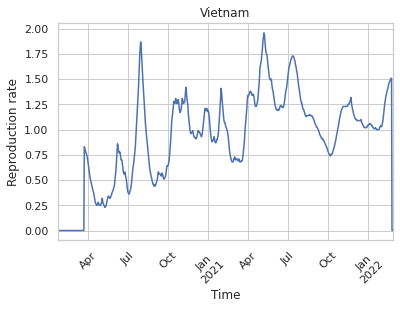

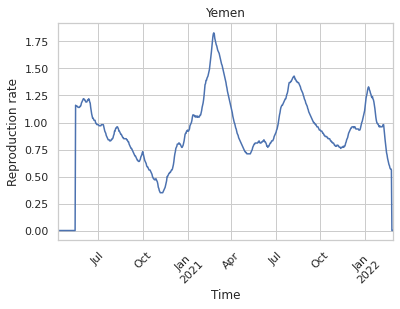

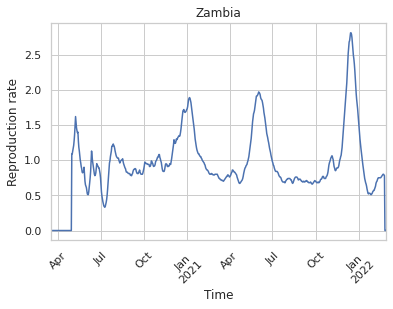

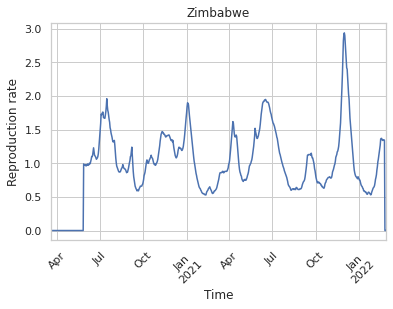

In [49]:
for i in df11['location'].unique():
    df11[df11['location']==i].groupby('date')['reproduction_rate'].max().plot()
    plt.xlabel('Time')
    plt.xticks(rotation=45)
    plt.ylabel('Reproduction rate')
    plt.title(i)
    plt.show()

Plot a chart of stringency index per country

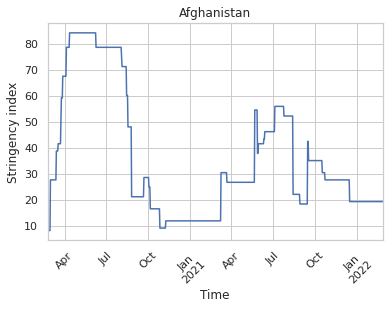

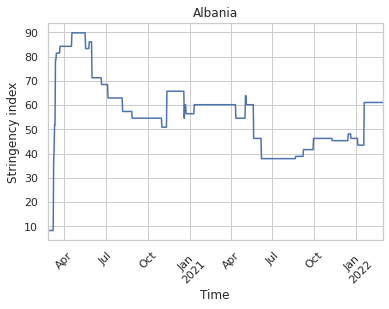

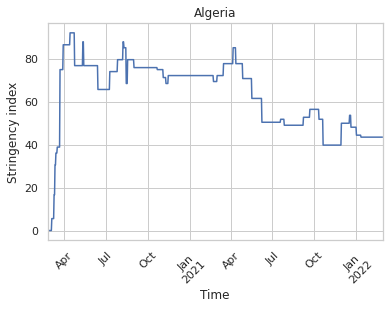

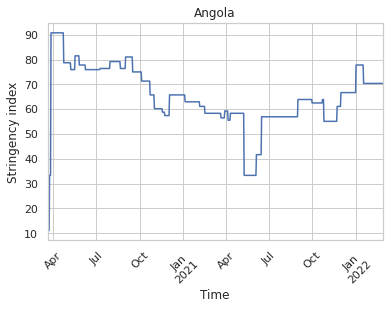

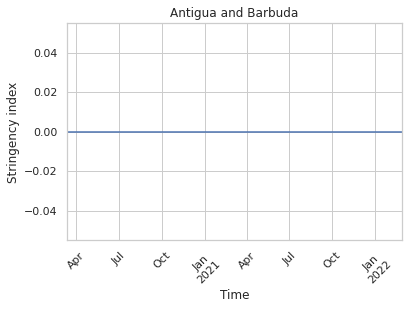

...

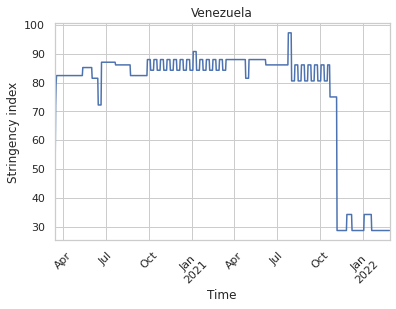

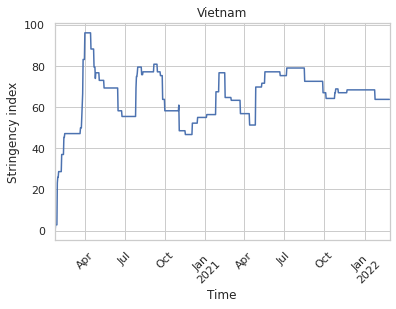

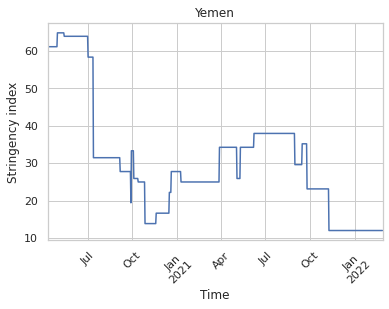

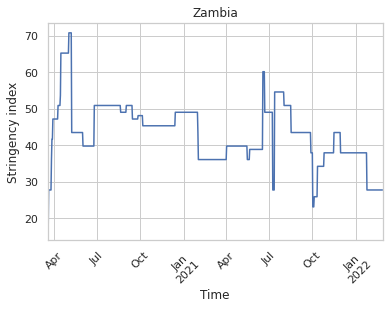

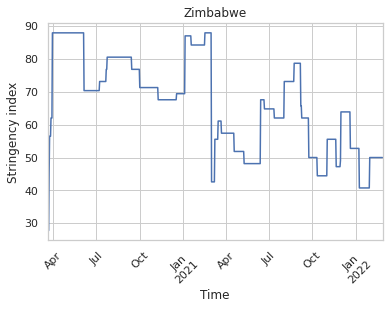

In [50]:
for i in df11['location'].unique():
    df11[df11['location']==i].groupby('date')['stringency_index'].max().plot()
    plt.xlabel('Time')
    plt.xticks(rotation=45)
    plt.ylabel('Stringency index')
    plt.title(i)
    plt.show()

Plot a chart of reproduction rate per continent

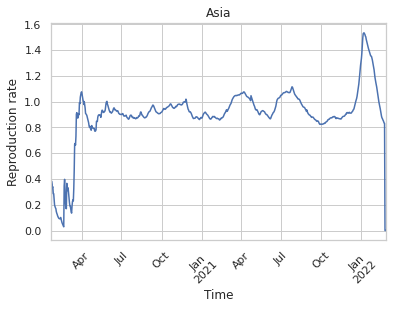

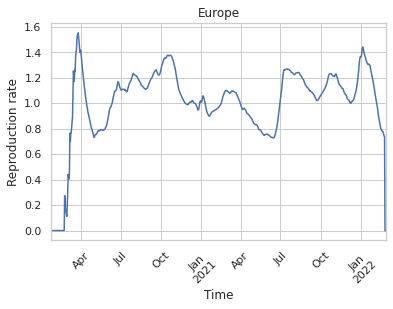

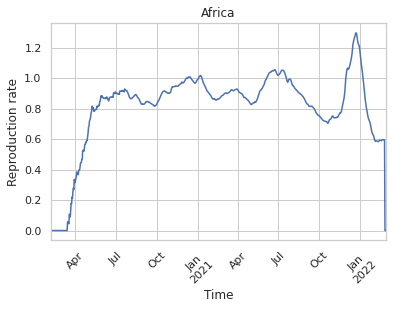

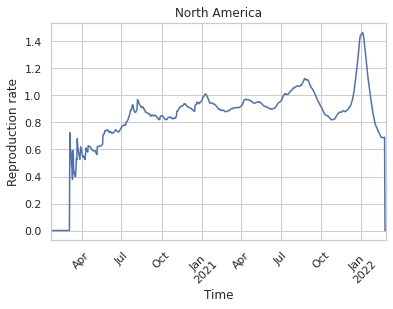

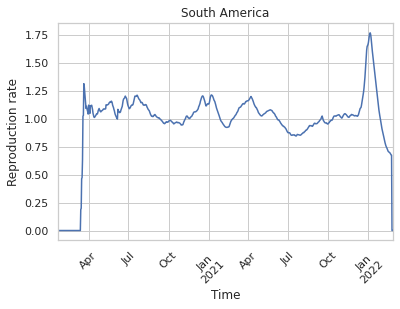

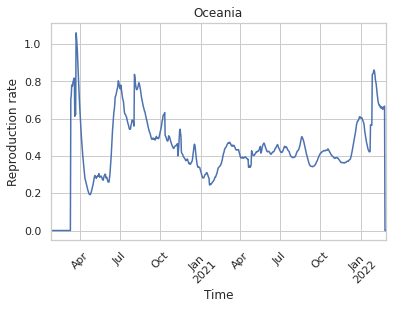

In [51]:
for i in df11['continent'].unique():
    df11[df11['continent']==i].groupby('date')['reproduction_rate'].mean().plot()
    plt.xlabel('Time')
    plt.xticks(rotation=45)
    plt.ylabel('Reproduction rate')
    plt.title(i)
    plt.show()

Plot a chart of stringency index per continent

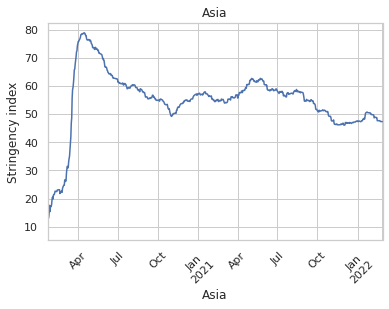

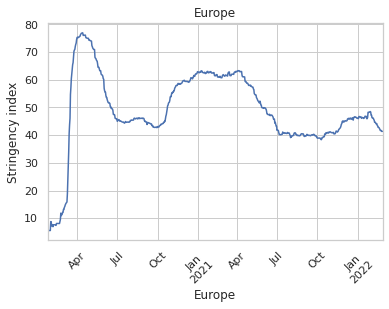

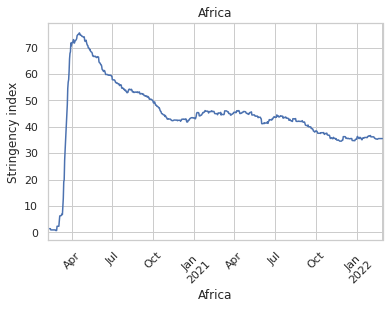

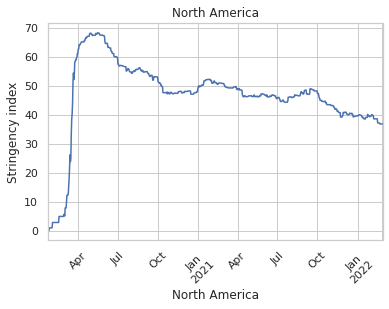

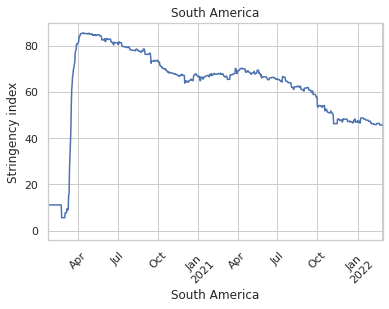

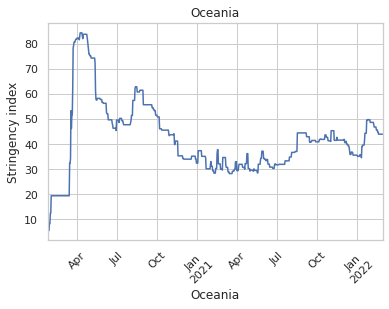

In [52]:
for i in df11['continent'].unique():
    df11[df11['continent']==i].groupby('date')['stringency_index'].mean().plot()
    plt.xlabel(i)
    plt.xticks(rotation=45)
    plt.ylabel('Stringency index')
    plt.title(i)
    plt.show()

Plot min_max 10 countries in a total/new (cases, deathes, vac or tests)for a continent

In [53]:
# Plot function to show min_max countries in a total/new (cases, deathes, vac or tests) for a continent
def min_max(df,min_max,n,con,total_new,table):
# df->dataframe
# min_max->the minimum or maximum countries
# n->number of countries to show
# con->continent
# total_new-> total/new (cases, deathes, vac or tests) 
# table->show a table of the countries
    temp_df=df[df['continent']==con].groupby('location')[total_new].last()
    if (n>(len(temp_df)))|(n<=0):
        n=len(temp_df)
    if min_max=='max':
        temp_df=temp_df.nlargest(n=n)
    else:
        temp_df=temp_df.nsmallest(n=n)
    temp_df.plot.bar()
    plt.xlabel("Country")
    plt.xticks(rotation=90)
    plt.ylabel(total_new)
    plt.title(f"{min_max} {n} countries in {con} by {total_new}")
    plt.show()
    if table==True:
         return temp_df.head(n)

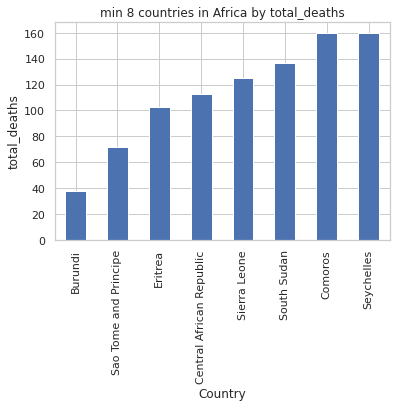

location
Burundi                      38
Sao Tome and Principe        72
Eritrea                     103
Central African Republic    113
Sierra Leone                125
South Sudan                 137
Comoros                     160
Seychelles                  160
Name: total_deaths, dtype: int32

In [54]:
min_max(df11,"min",8,"Africa",'total_deaths',True)

Plot new features by continent for the whole period of dataset

In [55]:
new=['new_cases','new_deaths','new_tests','new_vaccinations']
for show in new: 
    i=0
    data=[]
    color=['green','blue','red','black','brown','orange']
    for con in df11.groupby('continent')['continent'].unique():

        globals()[f"trace{i}"] = go.Scatter(
                            x = df11[(df11['continent']==con[0])].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                            y = df11[(df11['continent']==con[0])].groupby(['date','continent'])[show].sum(),
                            mode = "lines",
                            name = con[0],
                            marker = dict(color = color[i]),
        )
    #     globals()[f"trace{i}"]=trace1
        data.append(globals()[f"trace{i}"])
        i+=1

    data = [trace1,trace2,trace3,trace4,trace5]
    layout = dict(title = show,
                  xaxis= dict(title= f'# {show} day by day',ticklen= 5,zeroline= False)
                 )
    fig = dict(data = data, layout = layout)
    iplot(fig)

Plot new deaths, new cases, and non-Pharmaceutical features clusters over countries

In [56]:
non_Pharmaceutical_list=['reproduction_rate','stringency_index','positive_rate','population_density',
         'median_age','aged_65_older','gdp_per_capita','cardiovasc_death_rate',
         'diabetes_prevalence','life_expectancy','human_development_index']
for feature in non_Pharmaceutical_list:
    df_grouped = df11.groupby(['location','continent']).agg(
        {'new_deaths': np.sum, feature: np.mean, 'new_cases':np.sum}
    ).reset_index()
    fig = px.scatter(df_grouped, 
                     x="new_deaths", y=feature, size="new_cases",
                     color="continent",hover_name="location", log_x=True,
                     size_max=60,title = f'New deaths, new cases, and {feature} clusters over countries')
    fig.show()

Plot clusters for new deaths, new cases, and one/double shot/s vaccinated features over countries

In [57]:
one_double_shot=['total_first_shot_vac','total_fully_vaccinated']
for feature in one_double_shot:
    df_grouped = df11.groupby(['location','continent']).agg(
        {'new_deaths': np.sum, feature: lambda x: x.iloc[-1], 'new_cases':np.sum}
    ).reset_index()
    fig = px.scatter(df_grouped, 
                     x="new_deaths", y=feature, size="new_cases",
                     color="continent",hover_name="location", log_x=True,
                     size_max=60,title = f'New deaths, new cases, and {feature} clusters over countries')
    fig.show()

Plot pie chart of total or new feature around the world

In [58]:
def pie_world(df,total_new):
    df_temp = df.groupby(['continent','location'])[total_new].max().reset_index()
    fig = px.sunburst(df_temp, path=['continent','location'], values=total_new,
                      title= f'{total_new} around the world',
                      height=620,template='none')
    fig.show()
pie_world(df11,'total_deaths')

Correlation Analysis

Plot the correlation between a feature and all others

In [59]:
def feature_cor(feature):
    correlations = df11.corr()[feature].abs().sort_values(ascending=False).drop(feature,axis=0).to_frame()
    correlations.plot(kind='bar');

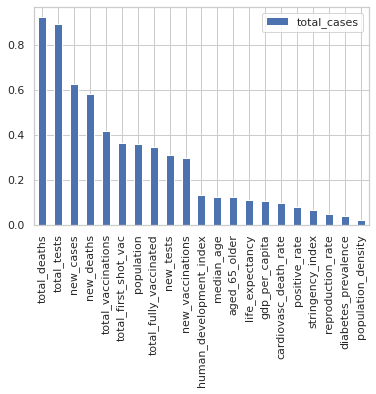

In [60]:
feature_cor('total_cases')

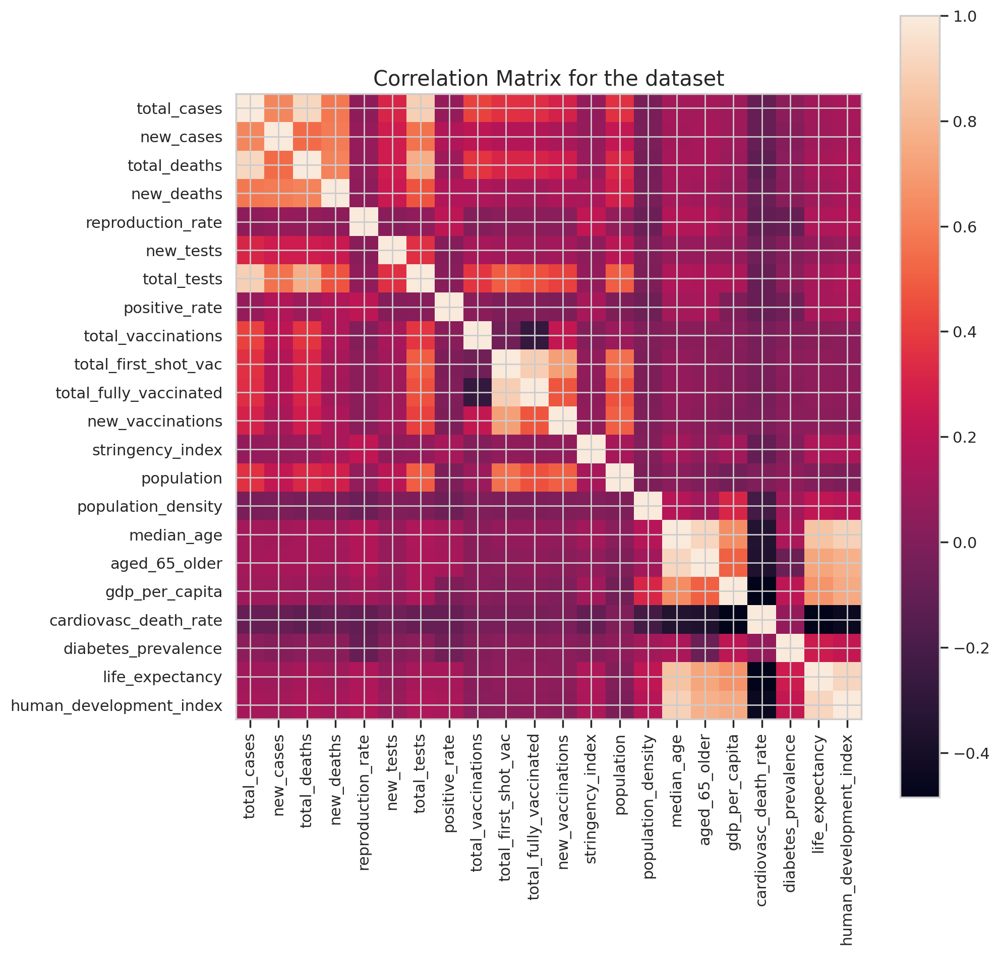

In [61]:
# Correlation matrix
corr = df11.corr()
plt.figure(num=None, figsize=(10, 10), dpi=200, facecolor='w', edgecolor='k')
corrMat = plt.matshow(corr, fignum = 1)
plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.gca().xaxis.tick_bottom()
plt.colorbar(corrMat)
plt.title(f'Correlation Matrix for the dataset', fontsize=15)
plt.show()

Plot the scatter and density for all features

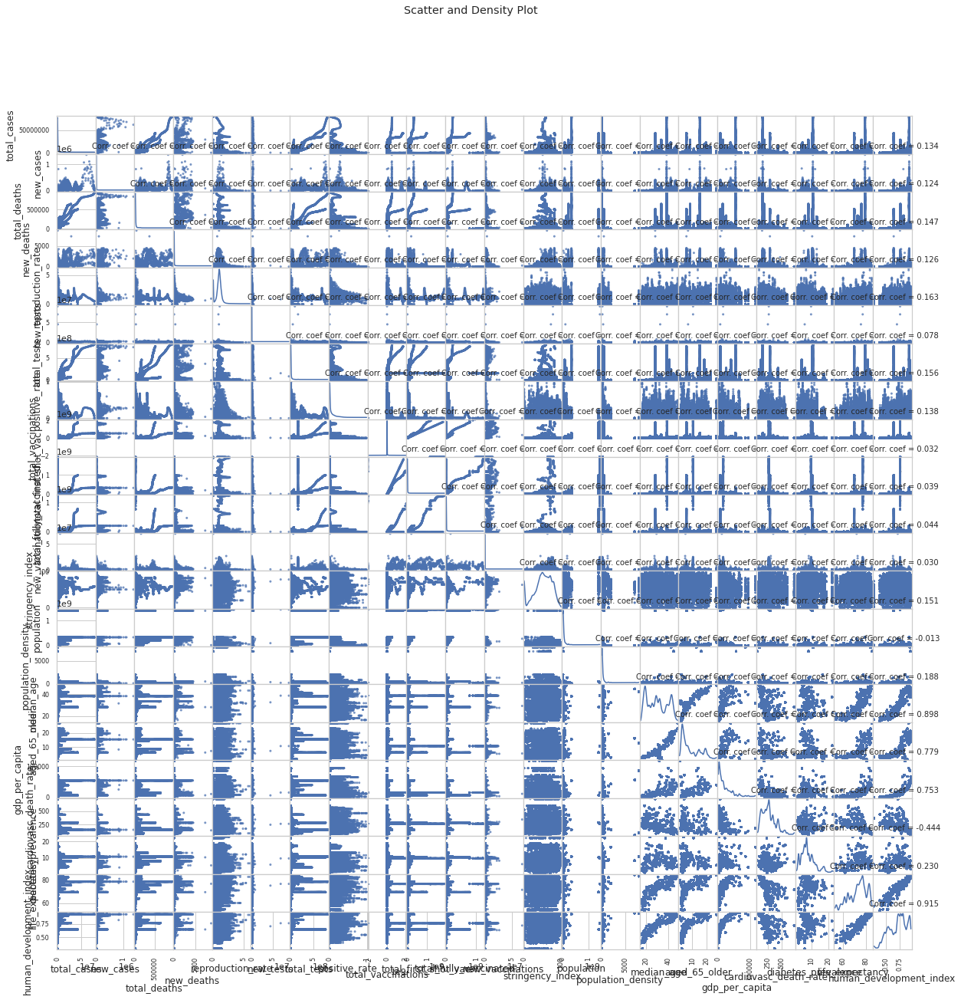

In [62]:
df_temp= df11.select_dtypes(include =[np.number]) # keep only numerical columns
ax = pd.plotting.scatter_matrix(df_temp, alpha=0.75, figsize=[20, 20], diagonal='kde')
corrs = df_temp.corr().values
for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
    ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=10)
plt.suptitle('Scatter and Density Plot')
plt.show()

Plot clustermap from the similarity matrix of the impact of non-pharmaceutical interventions on one of Total or New feature in dataset among 10 countries have top rank in the selected feature

In [63]:
from tqdm import tqdm
from dtaidistance import dtw
def similarity_matrix(df,non_pharmaceutical_factor,total_new):
    selected_countries = df.groupby('iso_code')[total_new].max().sort_values(ascending=False).iloc[:10].index
    df_temp=df[['iso_code','date',non_pharmaceutical_factor]].set_index('date')
    factor_train = {}

    for country in selected_countries : 
            factor = df_temp[df_temp['iso_code']==country].copy().sort_index()
            factor_train[country]=factor

    factor_train_selection = []
    for my_country in factor_train.keys():
        if (factor_train[my_country][non_pharmaceutical_factor].std()>0):
            factor_train_selection.append(my_country)

    n=len(factor_train_selection)
    similarity_matrix = np.empty([n,n])
    for i,first_country in tqdm(enumerate(factor_train_selection)):
        for j,second_country in enumerate(factor_train_selection):
            if j>=i:
                first_factor = factor_train[first_country][non_pharmaceutical_factor]
                second_factor = factor_train[second_country][non_pharmaceutical_factor]
                distance = dtw.distance(first_factor,second_factor)
                similarity_matrix[i][j],similarity_matrix[j][i] = distance, distance

    df_similarity_matrix = pd.DataFrame(similarity_matrix, columns=factor_train_selection, index=factor_train_selection)
#     fig, ax = plt.subplots(figsize=(10,10)) 
    sns.clustermap(df_similarity_matrix)

10it [03:09, 18.99s/it]


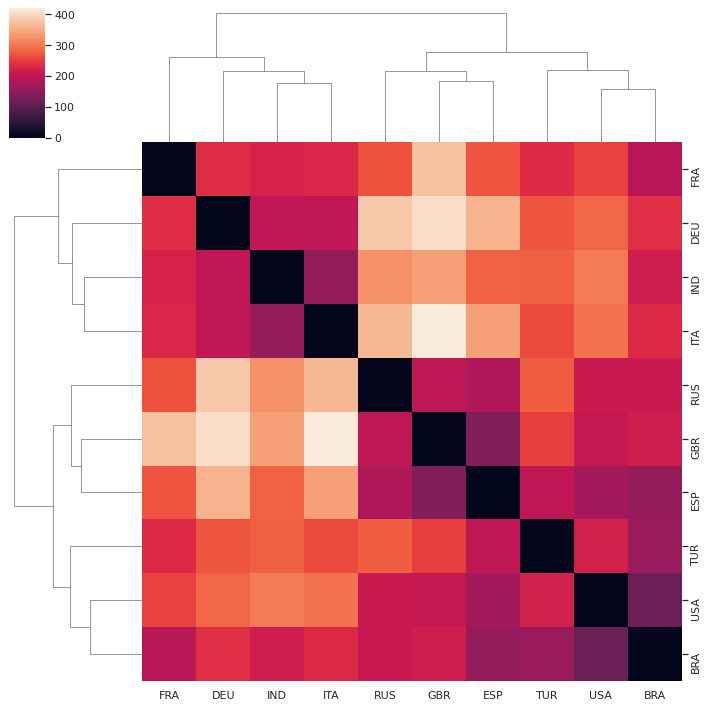

In [64]:
similarity_matrix(df11,'stringency_index','total_cases')

## Model Building Phase
1. Prophet library.
2. SARIMA.
3. SARIMAX.

### 1- Prophet Prediction

We use Prophet, a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well. It is also an open source software released by Facebook’s Core Data Science team. It is available for download on CRAN and PyPI.

Why Prophet?

Prophet is easy to customize and use, and to produce accurate forecasts which can be explained intuitively with supporting evidence such as forecast seasonality components. It allows the analyst to explain in an intuitive and convinving manner to higher management as to why the forecasts are as such, and the plausible underlying factors that contribute to its result. Furthermore, it is also open-source!

References

https://facebook.github.io/prophet/

https://facebook.github.io/prophet/docs/

https://github.com/facebook/prophet

#### Prophet with Daily & Weekly Seasonality (with custom Fourier orders):

Prophet will by default fit weekly and yearly seasonalities, if the time series is more than two cycles long. It will also fit daily seasonality for a sub-daily time series. You can add other seasonalities (monthly, quarterly, hourly) using the add_seasonality method (Python) or function (R).

The inputs to this function are a name, the period of the seasonality in days, and the Fourier order for the seasonality. For reference, by default Prophet uses a Fourier order of 3 for weekly seasonality and 10 for yearly seasonality. An optional input to add_seasonality is the prior scale for that seasonal component - this is discussed below.

Source: https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html#fourier-order-for-seasonalities

In [65]:
! pip install Prophet

     |████████████████████████████████| 65 kB 266 kB/s            
  Preparing metadata (setup.py) ... - done
     |████████████████████████████████| 49 kB 822 kB/s            
  Created wheel for Prophet: filename=prophet-1.0.1-py3-none-any.whl size=9433545 sha256=33d972e1bc5477dbd73c0cbabfff729738200cd68c5b763b1ff6a17094135bab
  Stored in directory: /root/.cache/pip/wheels/4e/a0/1a/02c9ec9e3e9de6bdbb3d769d11992a6926889d71567d6b9b67
Successfully built Prophet
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fbprophet 0.7.1 requires cmdstanpy==0.9.5, but you have cmdstanpy 0.9.68 which is incompatible.


In [66]:
from prophet import Prophet

As we are now forecasting at country level, for small values, it is possible for forecasts to become negative. To counter this, we round negative values to zero. To perform forecast evaluations using mean absolute error (MAE), we require to partition the dataset into train & validation sets. Here, the test set will contain the dates for which the Prophet model is trained on and where forecasts were made.

In [67]:
def prophet_prediction(df,country,days_to_forecast=7,first_forecasted_date='2022-01-03',mode = 'default',plot=1):
    features_to_predict=['new_cases','new_deaths','new_tests','new_vaccinations']
    mean_absolute_errors=[]
    first_forecasted_date=pd.to_datetime(first_forecasted_date)
    df_loc=df[df.location==country]
    df_loc['date']=pd.to_datetime(df_loc['date'])

#     forecast_dfs has actual and predicted values and its MAE
    forecast_dfs=df_loc[df_loc['date']>=first_forecasted_date][['location','date']].rename(columns={'date': 'ds'})
    for feature in features_to_predict:
        df_temp=df_loc[['date',feature]].rename(columns={feature: 'y', 'date': 'ds'})

#        Prepare the train and test datasets
        train = df_temp[df_temp.ds <pd.to_datetime(first_forecasted_date)]
        test = df_temp[df_temp.ds >=pd.to_datetime(first_forecasted_date)]

#         Forecasting the feature with Prophet by the country
#         With baseline Prophet Model, using default parameters
        if mode == 'default':
            model = Prophet()
#         With custom seasonalities & Fourier orders
        elif mode == 'custom':
            model = Prophet(daily_seasonality=False, weekly_seasonality=False, yearly_seasonality=False)
            model.add_seasonality(name='monthly', period=30.5, fourier_order=10)
            model.add_seasonality(name='weekly', period=7, fourier_order=21)
            model.add_seasonality(name='daily', period=1, fourier_order=3)
        model.fit(train)
        future = model.make_future_dataframe(periods=days_to_forecast)
        forecast = model.predict(future)
    
#         save the forcasted values and its MAE
        forecast_df = forecast[['ds', 'yhat']]
        result_df = forecast_df[(pd.to_datetime(forecast_df['ds']) >= first_forecasted_date)]
        result_val_df = result_df.merge(test, on=['ds'])
        result_val_df['absolute_errors'] = (result_val_df['y'] - result_val_df['yhat']).abs()
        mean_absolute_errors += list(result_val_df['absolute_errors'].values)
#         Round negative values to zero
        result_val_df.yhat=result_val_df.yhat.mask(result_val_df.yhat.lt(0),0)
#         Round decimal values to int
        result_val_df.yhat=result_val_df.yhat.round()
        result_val_df=result_val_df.rename(columns={'y':feature, 'absolute_errors':f'{feature}_absolute_errors','yhat':f'{feature}_predicted'})
        forecast_dfs=pd.merge(forecast_dfs,result_val_df,on=('ds'))

#         Plot actual vs. predicted results for the feature in the country
        if plot==1:
            fig = go.Figure(
                layout=go.Layout(title=go.layout.Title(
                    text=f"Actual vs. Predicted results for {feature} in {country}")))
            fig.add_trace( go.Scatter(x=forecast.ds, y=forecast.yhat, error_y=dict(
                        type='data', # value of error bar given in data coordinates
                        symmetric=False,
                        array=forecast.yhat_upper - forecast.yhat,
                        arrayminus=forecast.yhat - forecast.yhat_lower,
                        visible=True), name='Forecast'))
            fig.add_trace( go.Scatter( x=train['ds'].values, y=train['y'].values, name='Actual'))
            fig.show()

#      Change the date column name   
    forecast_dfs=forecast_dfs.rename(columns={'ds':'date'})
#     Calculate the mean of all mean_absolute_errors
    mean_absolute_errors=np.mean(mean_absolute_errors)
            
    return forecast_dfs,mean_absolute_errors

In [68]:
forecast_dfs_default,mae_default=prophet_prediction(df11,'Canada',days_to_forecast=7,first_forecasted_date='2022-01-03',mode = 'default',plot=1)

Initial log joint probability = -41.7934
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1470.68    0.00187658       75.8903     0.07528      0.3089      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       1473.07    0.00128897        110.26   1.551e-05       0.001      205  LS failed, Hessian reset 
     165       1474.06    0.00174699       148.686   2.986e-05       0.001      269  LS failed, Hessian reset 
     199        1474.6    0.00120767       94.0321      0.3104           1      311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       1474.94   0.000714106       79.8253   9.005e-06       0.001      376  LS failed, Hessian reset 
     283       1475.18   1.21294e-05       67.7565   2.005e-07       0.001      496  LS failed, Hessian reset 
     299       1475.18   6.28772e-07       68.0752           1   

Initial log joint probability = -22.5294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       821.741    1.4095e-07       74.4588      0.2463      0.7322      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       821.752   3.34926e-05       64.5983    3.81e-07       0.001      219  LS failed, Hessian reset 
     161       821.754   1.05787e-06       71.7529   1.406e-08       0.001      301  LS failed, Hessian reset 
     188       821.754   4.45988e-07       76.8101   6.483e-09       0.001      375  LS failed, Hessian reset 
     196       821.754   5.58464e-08       62.4887      0.3582           1      385   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Initial log joint probability = -66.6311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1109.44    0.00472458       79.8865      0.2019           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188        1114.3   2.99749e-08       69.9292      0.3168      0.3168      257   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Initial log joint probability = -14.7936
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       1220.49    0.00297202       240.543   2.626e-05       0.001      146  LS failed, Hessian reset 
      99       1224.22    0.00560417       70.0875           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       1227.14   0.000529549        60.833   4.806e-06       0.001      320  LS failed, Hessian reset 
     199       1228.41     0.0014499       68.2808       0.465       0.465      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     253       1228.98   0.000813704       98.4024   1.117e-05       0.001      442  LS failed, Hessian reset 
     299       1229.03   1.07118e-08       73.9117     0.05021     0.05021      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

In [69]:
forecast_dfs_custom,mae_custom=prophet_prediction(df11,'Canada',days_to_forecast=7,first_forecasted_date='2022-01-03',mode = 'custom',plot=1)

Initial log joint probability = -41.7934
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1469.15    0.00904643       201.233      0.1933           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1476.67    0.00150261       156.253           1           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       1478.65   0.000182848       112.446   1.077e-06       0.001      329  LS failed, Hessian reset 
     299       1479.97    0.00106763       88.5136           1           1      399   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     324       1480.05   7.63302e-05       81.7973   1.115e-06       0.001      468  LS failed, Hessian reset 
     399       1480.07   2.09008e-07       62.7163      0.4918      0.4918      562   
    Iter      log pro

Initial log joint probability = -22.5294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       822.636    0.00188583       103.201   2.417e-05       0.001      132  LS failed, Hessian reset 
      99       822.751   0.000109294       69.2972           1           1      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       822.856   2.02672e-06       63.2205           1           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       822.856    1.1607e-07       77.0266           1           1      324   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Initial log joint probability = -66.6311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1096.2     0.0328767         238.3           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       1115.44   0.000481864       122.035   3.323e-06       0.001      260  LS failed, Hessian reset 
     199       1116.83    0.00218081       57.8849      0.9881      0.9881      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       1117.33   0.000805024       113.944   1.749e-05       0.001      315  LS failed, Hessian reset 
     299       1118.74   4.18213e-07       75.2496      0.2112      0.2112      431   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       1118.74   7.58147e-07        78.373   9.736e-09       0.001      489  LS failed, Hessian rese

Initial log joint probability = -14.7936
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1215.75   0.000651961       208.118      0.6563     0.06563      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1228.66    0.00297785       82.4295      0.1253      0.4556      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     261       1231.11   0.000560886       147.671   4.457e-06       0.001      371  LS failed, Hessian reset 
     299       1231.76      0.006656        148.36           1           1      418   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     328       1232.54    0.00153773       272.926    1.47e-05       0.001      494  LS failed, Hessian reset 
     372       1232.73   5.03013e-08       75.0341      0.2955           1      555   
Optimization terminat

In [70]:
forecast_dfs_custom

,location,date,new_cases_predicted,new_cases,new_cases_absolute_errors,new_deaths_predicted,new_deaths,new_deaths_absolute_errors,new_tests_predicted,new_tests,new_tests_absolute_errors,new_vaccinations_predicted,new_vaccinations,new_vaccinations_absolute_errors
0,Canada,2022-01-03,10813.0,39293,28479.500466,8.0,30,22.370037,114313.0,14510,99802.848393,89157.0,97903,8746.343060
1,Canada,2022-01-04,10041.0,47842,37800.727022,12.0,36,23.916533,98819.0,601278,502458.988999,68408.0,583844,515436.452269
2,Canada,2022-01-05,10530.0,38354,27824.105424,19.0,89,69.985928,92584.0,137777,45193.386939,73703.0,389755,316052.183456
3,Canada,2022-01-06,10692.0,41674,30981.931834,14.0,60,46.313758,113052.0,145814,32762.113747,86382.0,418371,331988.953248
4,Canada,2022-01-07,10961.0,44511,33550.467924,11.0,83,72.163836,122402.0,152673,30271.366724,98137.0,427667,329530.300839
5,Canada,2022-01-08,10475.0,30903,20428.469446,8.0,31,22.919716,119475.0,100599,18875.769973,57596.0,300494,242898.271652
6,Canada,2022-01-09,10114.0,29183,19068.893318,0.0,66,67.033741,108816.0,17880,90936.065208,37981.0,216542,178560.799474


In [71]:
forecast_dfs_default

,location,date,new_cases_predicted,new_cases,new_cases_absolute_errors,new_deaths_predicted,new_deaths,new_deaths_absolute_errors,new_tests_predicted,new_tests,new_tests_absolute_errors,new_vaccinations_predicted,new_vaccinations,new_vaccinations_absolute_errors
0,Canada,2022-01-03,11005.0,39293,28287.669922,12.0,30,18.183084,115546.0,14510,101035.857476,96582.0,97903,1320.813514
1,Canada,2022-01-04,10369.0,47842,37473.110718,13.0,36,23.198662,100278.0,601278,501000.179800,88484.0,583844,495359.771339
2,Canada,2022-01-05,10722.0,38354,27631.594800,16.0,89,73.145070,98723.0,137777,39053.584072,97441.0,389755,292314.497181
3,Canada,2022-01-06,10949.0,41674,30724.702037,15.0,60,45.040994,116532.0,145814,29281.800834,102686.0,418371,315685.341368
4,Canada,2022-01-07,11103.0,44511,33408.278932,13.0,83,70.124961,122621.0,152673,30052.223596,113644.0,427667,314022.764995
5,Canada,2022-01-08,10462.0,30903,20440.762093,5.0,31,25.554392,122035.0,100599,21435.661460,73810.0,300494,226683.734833
6,Canada,2022-01-09,10386.0,29183,18797.246751,1.0,66,65.455819,111547.0,17880,93667.359207,56228.0,216542,160313.627608


In [72]:
mae_custom

105070.45153443262

In [73]:
mae_default

100653.974482709

### 2- SARIMA Model

In [74]:
# df=df.drop(['Unnamed: 0'],axis=1)
df=df11[df11['location']=="Canada"]
df=df[['date','new_cases']].set_index('date')


Time series Stationary check

In [75]:
from statsmodels.tsa.stattools import adfuller

In [76]:
def ad_test(df):
    dftest=adfuller(df,autolag='AIC')
#     print adfuller test P-value
    print(dftest[1])

In [77]:
ad_test(df['new_cases'])

0.1417532945998392


The new cases time series is not stationary. To be stationary, P-value should be less than 0.05

In [78]:
from pmdarima import auto_arima
import warnings
warnings.filterwarnings('ignore')

Use auto_arima to find best model

In [79]:
best_model=auto_arima(df['new_cases'],trace=True,suppress_warnings=True)
best_model.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=14141.409, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=14517.424, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=14326.441, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=14199.037, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=14515.426, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=14052.535, Time=1.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=14172.868, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=14187.489, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=14069.111, Time=1.70 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=14120.229, Time=0.32 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=14143.085, Time=0.19 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=14053.700, Time=1.00 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=14050.550, Time=0.78 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=14170.820, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  764
Model:               SARIMAX(1, 1, 2)   Log Likelihood               -7021.275
Date:                Mon, 28 Feb 2022   AIC                          14050.550
Time:                        07:49:30   BIC                          14069.099
Sample:                             0   HQIC                         14057.692
                                - 764                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8418      0.007    115.078      0.000       0.827       0.856
ma.L1         -1.7613      0.006   -314.736      0.000      -1.772      -1.750
ma.L2          0.8856      0.006    147.759      0.000       0.874       0.897
sigma2      5.746e+06   2.35e-10   2.45e+16      0.000    5.75e+06    5.75e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):             26572.44
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):             444.44   Skew:                             1.70
Prob(H) (two-sided):                  0.00   Kurtosis:                        31.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.66e+30. Standard errors may be unstable.
"""

In [80]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# evaluation
from sklearn import metrics
# plotly offline
# from plotly.offline import download_plotlyjs,init_notebook_mode
# init_notebook_mode(connected=True)

Decompose the Time series: Trend, Seasonality, error/white noise

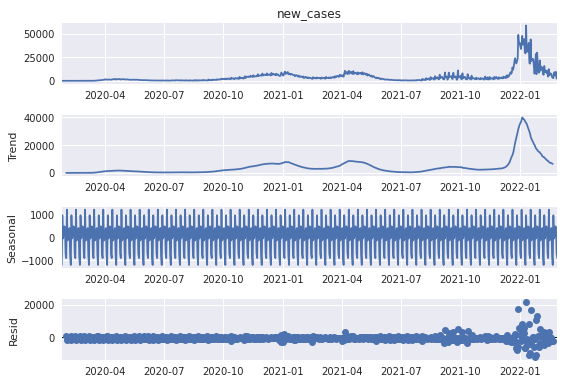

In [81]:
plt.style.use('seaborn');
decompose = seasonal_decompose(df['new_cases'],model='additive',period=14);
decompose.plot();

Plot ACF: auto-correlation function

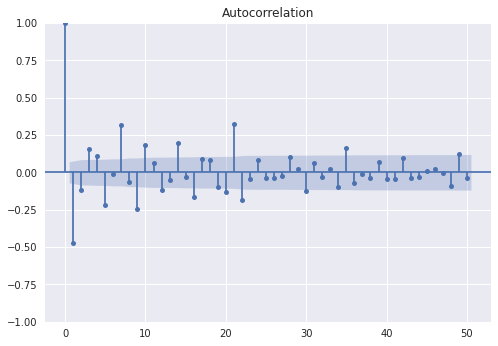

In [82]:
plot_acf(df['new_cases'].diff().dropna(),lags=50);

Plot PACF: partial auto-correlation function

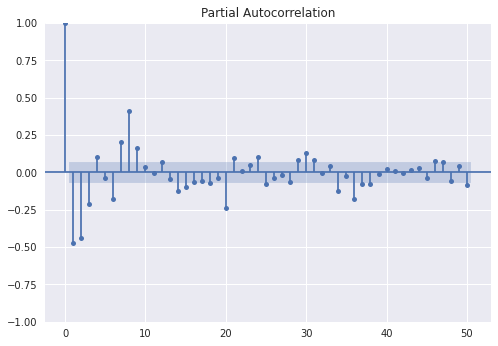

In [83]:
plot_pacf(df['new_cases'].diff().dropna(),lags=50);

SARIMA model with p=4, d=1, q=5 and seasonal_order=7

In [84]:
def SARIMA_model(df,country,test_size,p,d,q,s,endog='new_cases', plot=1):
    df_temp=df[df['location']==country]
    df_temp=df_temp[['date',endog]].set_index('date')
    train=df_temp.iloc[:-test_size]
    test=df_temp.iloc[-test_size:]
    SARIMA_model = sm.tsa.statespace.SARIMAX(train.values,
                                                order=(p, d, q),
                                                seasonal_order=(0,0,0,s),
                                             enforce_stationarity=False,
                                             enforce_invertibility=False)
    SARIMA_model = SARIMA_model.fit(maxiter=1000)
#     Forecast
    SARIMA_forecast =SARIMA_model.get_forecast(steps=test_size)
    SARIMA_pred = SARIMA_forecast.summary_frame(alpha=0.05).set_index(pd.date_range(start=test.index[0], periods=test_size, freq='D'))
#     Evaluate the model by RMSE
    SARIMA_RSME = np.sqrt(metrics.mean_squared_error(test,SARIMA_pred['mean']))
    
    if plot==1:
        df_temp=df_temp.tail(30)
        fig = go.Figure(
        layout=go.Layout(title=go.layout.Title(
            text=f"Actual vs. Predicted results for {endog} in {country}")))
        fig.add_trace(go.Scatter(name="Actual",
             x=df_temp.index, y=df_temp[endog]))
        fig.add_trace(go.Scatter(name="Predicted",
             x=SARIMA_pred.index, y=SARIMA_pred['mean']))
        fig.add_trace(go.Scatter(name="Lowerbound",
            line=dict(width=0),fill='tozeroy', opacity=0.1, showlegend=False,
            x=SARIMA_pred.index, y=SARIMA_pred['mean_ci_lower']))
        fig.add_trace(go.Scatter(name="Upperbound",
            fill='tozeroy', opacity=0.1, showlegend=False,
            x=SARIMA_pred.index, y=SARIMA_pred['mean_ci_upper']))
        fig.show()
        
    return SARIMA_model,SARIMA_pred,SARIMA_RSME

In [85]:
SARIMA_model,SARIMA_pred,SARIMA_RSME=SARIMA_model(
    df11,"Canada",test_size=7,p=4,d=1,q=5,s=7,plot=1)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.10320D+00    |proj g|=  3.00625D-01

At iterate    5    f=  9.06333D+00    |proj g|=  4.61060D-02

At iterate   10    f=  9.05431D+00    |proj g|=  2.45075D-02

At iterate   15    f=  9.05360D+00    |proj g|=  6.06116D-03

At iterate   20    f=  9.05341D+00    |proj g|=  7.51523D-03

At iterate   25    f=  9.05336D+00    |proj g|=  1.60289D-03

At iterate   30    f=  9.05335D+00    |proj g|=  3.28390D-03

At iterate   35    f=  9.05277D+00    |proj g|=  3.92024D-02

At iterate   40    f=  9.04832D+00    |proj g|=  4.40403D-02

At iterate   45    f=  9.04700D+00    |proj g|=  1.26881D-02

At iterate   50    f=  9.04670D+00    |proj g|=  2.03841D-02

At iterate   55    f=  9.04601D+00    |proj g|=  1.57546D-02

At iterate   60    f=  9.04572D+00    |proj g|=  6.46732D-03

At iterate   65    f=  9.0

In [86]:
# Model summary
SARIMA_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  757
Model:               SARIMAX(4, 1, 5)   Log Likelihood               -6847.258
Date:                Mon, 28 Feb 2022   AIC                          13714.516
Time:                        07:49:48   BIC                          13760.717
Sample:                             0   HQIC                         13732.318
                                - 757                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8881      0.069     12.841      0.000       0.753       1.024
ar.L2         -0.7745      0.065    -11.847      0.000      -0.903      -0.646
ar.L3          0.7198      0.059     12.240      0.000       0.605       0.835
ar.L4         -0.1410      0.053     -2.677      0.007      -0.244      -0.038
ma.L1         -1.7965      0.072    -25.091      0.000      -1.937      -1.656
ma.L2          1.7456      0.140     12.490      0.000       1.472       2.019
ma.L3         -1.3099      0.153     -8.567      0.000      -1.610      -1.010
ma.L4          0.4601      0.126      3.638      0.000       0.212       0.708
ma.L5          0.1446      0.056      2.593      0.010       0.035       0.254
sigma2       5.46e+06   3.13e-07   1.75e+13      0.000    5.46e+06    5.46e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):             43375.71
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):             389.24   Skew:                             2.45
Prob(H) (two-sided):                  0.00   Kurtosis:                        39.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.24e+28. Standard errors may be unstable.
"""

In [87]:
SARIMA_pred

y,mean,mean_se,mean_ci_lower,mean_ci_upper
2022-02-21,6263.097450,2336.650712,1683.346210,10842.848691
2022-02-22,4811.936312,2346.432495,213.013130,9410.859495
2022-02-23,4812.822079,2421.430769,66.904980,9558.739177
2022-02-24,5608.778738,2704.224892,308.595344,10908.962132
2022-02-25,4187.105601,2784.237573,-1269.899766,9644.110968
2022-02-26,2513.214722,2853.778868,-3080.089079,8106.518523
2022-02-27,2700.390589,3176.472322,-3525.380761,8926.161938


In [88]:
SARIMA_RSME

3279.912474671371

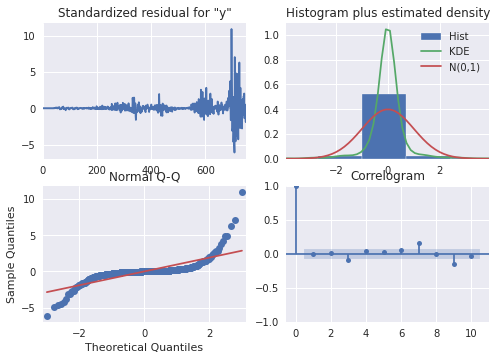

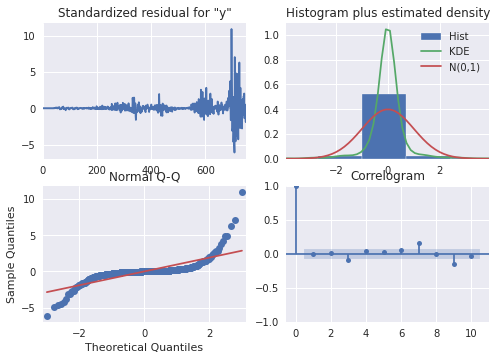

In [89]:
plt.style.use('seaborn')
SARIMA_model.plot_diagnostics()

### 3- SARIMAX Model

In [90]:
def SARIMAX_model(df,country,test_size,p,d,q,s,endog='new_cases',exog=['new_deaths','new_tests'],plot=1):
    df_temp=df[df['location']==country]
    df_temp_features_list=['date',endog]+exog
    df_temp=df_temp[df_temp_features_list].set_index('date')
    train=df_temp.iloc[:-test_size]
    test=df_temp.iloc[-test_size:]
    
    SARIMAX_model = sm.tsa.statespace.SARIMAX(train[endog].values,exons=train[exog],
                                            order=(p,d,q),
                                            seasonal_order=(p,d,q,s),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,)

    SARIMAX_model = SARIMAX_model.fit(maxiter=1000)
#     Forecast
    SARIMAX_forecast =SARIMAX_model.get_forecast(steps=test_size)
    SARIMAX_pred = SARIMAX_forecast.summary_frame(alpha=0.05).set_index(pd.date_range(start=test.index[0], periods=test_size, freq='D'))

#     Plot the prediction results
    if plot==1:
        df_temp=df_temp.tail(30)
        fig = go.Figure(
        layout=go.Layout(title=go.layout.Title(
            text=f"Actual vs. Predicted results for {endog} in {country}")))
        fig.add_trace(go.Scatter(name="Actual",
             x=df_temp.index, y=df_temp[endog]))
        fig.add_trace(go.Scatter(name="Predicted",
             x=SARIMAX_pred.index, y=SARIMAX_pred['mean']))
        fig.add_trace(go.Scatter(name="Lowerbound",
            line=dict(width=0),fill='tozeroy', opacity=0.1, showlegend=False,
            x=SARIMAX_pred.index, y=SARIMAX_pred['mean_ci_lower']))
        fig.add_trace(go.Scatter(name="Upperbound",
            fill='tozeroy', opacity=0.1, showlegend=False,
            x=SARIMAX_pred.index, y=SARIMAX_pred['mean_ci_upper']))
        fig.show()
    return SARIMAX_model,SARIMAX_pred

In [91]:
SARIMAX_model,SARIMAX_pred=SARIMAX_model(
    df11,"Canada",test_size=7,p=5,d=1,q=4,s=7,endog='new_cases',exog=['new_deaths','new_tests'],plot=1)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           19     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.62315D+00    |proj g|=  2.88198D-01


 This problem is unconstrained.



At iterate    5    f=  8.54074D+00    |proj g|=  5.54565D-02

At iterate   10    f=  8.52462D+00    |proj g|=  5.43538D-02

At iterate   15    f=  8.52160D+00    |proj g|=  1.05465D-02

At iterate   20    f=  8.52120D+00    |proj g|=  2.79501D-03

At iterate   25    f=  8.52103D+00    |proj g|=  2.94969D-03

At iterate   30    f=  8.52100D+00    |proj g|=  1.21665D-03

At iterate   35    f=  8.52099D+00    |proj g|=  8.84998D-04

At iterate   40    f=  8.52095D+00    |proj g|=  2.10218D-03

At iterate   45    f=  8.52091D+00    |proj g|=  1.64037D-03

At iterate   50    f=  8.52089D+00    |proj g|=  1.03270D-03

At iterate   55    f=  8.52087D+00    |proj g|=  1.00840D-03

At iterate   60    f=  8.52084D+00    |proj g|=  1.00468D-03

At iterate   65    f=  8.52083D+00    |proj g|=  1.04645D-03

At iterate   70    f=  8.52083D+00    |proj g|=  7.96770D-04

At iterate   75    f=  8.52083D+00    |proj g|=  4.35286D-04

At iterate   80    f=  8.52083D+00    |proj g|=  2.70555D-04

At iter

In [92]:
# Model summary
SARIMAX_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  757
Model:             SARIMAX(5, 1, 4)x(5, 1, 4, 7)   Log Likelihood               -6432.601
Date:                           Mon, 28 Feb 2022   AIC                          12903.201
Time:                                   07:54:19   BIC                          12989.914
Sample:                                        0   HQIC                         12936.701
                                           - 757                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1549      0.038    -30.124      0.000      -1.230      -1.080
ar.L2          0.1996      0.054      3.714      0.000       0.094       0.305
ar.L3          0.7733      0.050     15.418      0.000       0.675       0.872
ar.L4          0.3246      0.053      6.131      0.000       0.221       0.428
ar.L5          0.0140      0.033      0.431      0.667      -0.050       0.078
ma.L1          0.3113      0.034      9.068      0.000       0.244       0.379
ma.L2         -1.0573      0.026    -40.517      0.000      -1.108      -1.006
ma.L3         -0.2528      0.031     -8.163      0.000      -0.314      -0.192
ma.L4          0.5271      0.023     22.844      0.000       0.482       0.572
ar.S.L7        0.4092      0.528      0.776      0.438      -0.625       1.443
ar.S.L14      -0.3257      0.714     -0.456      0.648      -1.725       1.074
ar.S.L21      -0.4501      0.655     -0.687      0.492      -1.735       0.835
ar.S.L28       0.2285      0.259      0.881      0.378      -0.280       0.737
ar.S.L35      -0.0767      0.166     -0.463      0.644      -0.402       0.248
ma.S.L7       -0.8686      0.526     -1.651      0.099      -1.900       0.162
ma.S.L14       0.0960      0.828      0.116      0.908      -1.527       1.719
ma.S.L21       0.4839      0.895      0.540      0.589      -1.271       2.238
ma.S.L28      -0.5498      0.343     -1.603      0.109      -1.222       0.122
sigma2      4.421e+06   1.25e-05   3.54e+11      0.000    4.42e+06    4.42e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             50976.40
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):             189.93   Skew:                             2.56
Prob(H) (two-sided):                  0.00   Kurtosis:                        44.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.54e+26. Standard errors may be unstable.
"""

In [93]:
SARIMAX_pred

y,mean,mean_se,mean_ci_lower,mean_ci_upper
2022-02-21,7140.366696,2102.731568,3019.088554,11261.644839
2022-02-22,5161.974271,2128.313893,990.555693,9333.392849
2022-02-23,3381.659914,2204.321641,-938.731112,7702.050940
2022-02-24,6228.856768,2433.693115,1458.905914,10998.807623
2022-02-25,4511.675911,2620.346627,-624.109105,9647.460927
2022-02-26,1095.362116,2732.592506,-4260.420779,6451.145012
2022-02-27,-525.943449,3069.468375,-6541.990917,5490.104018


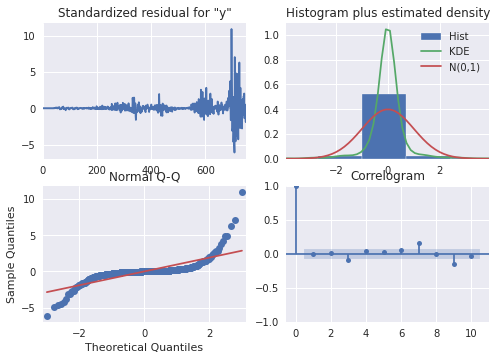

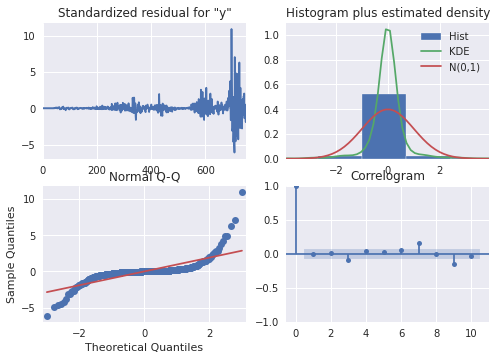

In [94]:
plt.style.use('seaborn')
SARIMA_model.plot_diagnostics()

I created a pretty nice dashboard to visualize this data using tableau:
[Dashboard](https://public.tableau.com/app/profile/husam.almasri/viz/Covid-19_16433519827770/Dashboard1)